In [1]:
# load dataset
from torch_geometric_temporal.dataset import WikiMathsDatasetLoader
from torch_geometric_temporal.signal import temporal_signal_split

loader = WikiMathsDatasetLoader()
dataset = loader.get_dataset(lags=14)

In [2]:
# split dataset
train_dataset, test_dataset = temporal_signal_split(dataset, train_ratio=0.8)

In [3]:
# define model
import torch
import torch.nn.functional as F
from torch_geometric_temporal.nn.recurrent import GConvGRU

class RecurrentGCN(torch.nn.Module):
    def __init__(self, node_features, filters):
        super(RecurrentGCN, self).__init__()
        self.recurrent = GConvGRU(node_features, filters, 2)
        self.linear = torch.nn.Linear(filters, 1)

    def forward(self, x, edge_index, edge_weight):
        h = self.recurrent(x, edge_index, edge_weight)
        h = F.relu(h)
        h = self.linear(h)
        return h

In [4]:
# train model
from tqdm import tqdm

model = RecurrentGCN(node_features=14, filters=32)

optimizer = torch.optim.Adam(model.parameters(), lr=0.01)

model.train()

for epoch in tqdm(range(50)):
    for time, snapshot in enumerate(train_dataset):
        y_hat = model(snapshot.x, snapshot.edge_index, snapshot.edge_attr)
        cost = torch.mean((y_hat-snapshot.y)**2)
        cost.backward()
        optimizer.step()
        optimizer.zero_grad()

100%|██████████| 50/50 [13:10<00:00, 15.80s/it]


In [5]:
# evaluate model
model.eval()
cost = 0
for time, snapshot in enumerate(test_dataset):
    y_hat = model(snapshot.x, snapshot.edge_index, snapshot.edge_attr)
    cost += torch.mean((y_hat-snapshot.y)**2)
cost = cost / (time+1)
cost = cost.item()
print('MSE: {:.4f}'.format(cost))

MSE: 0.8385


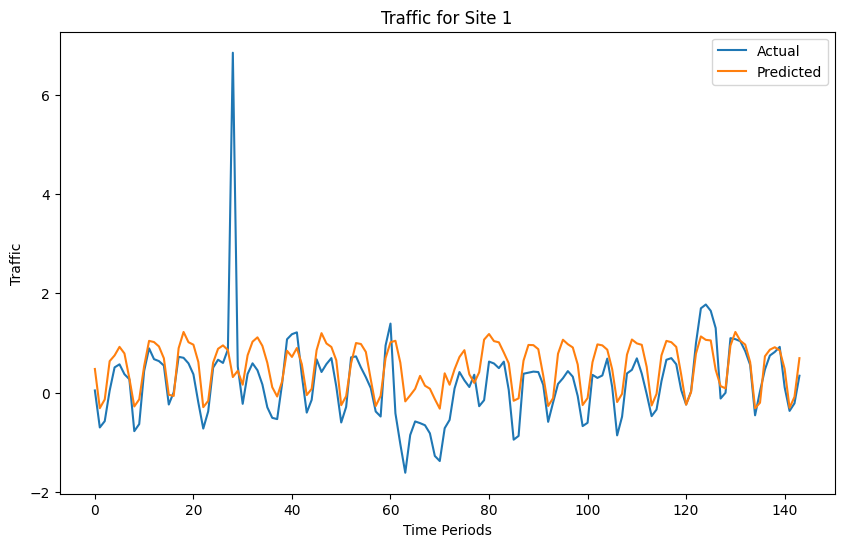

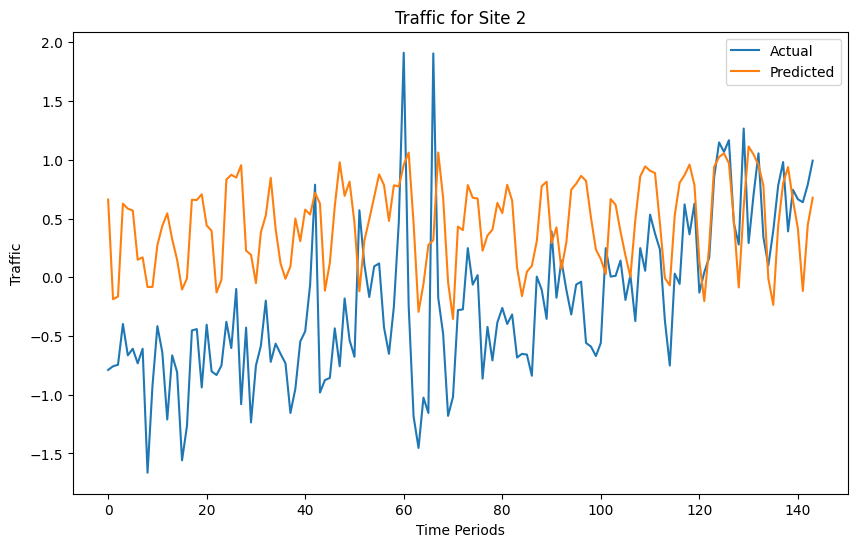

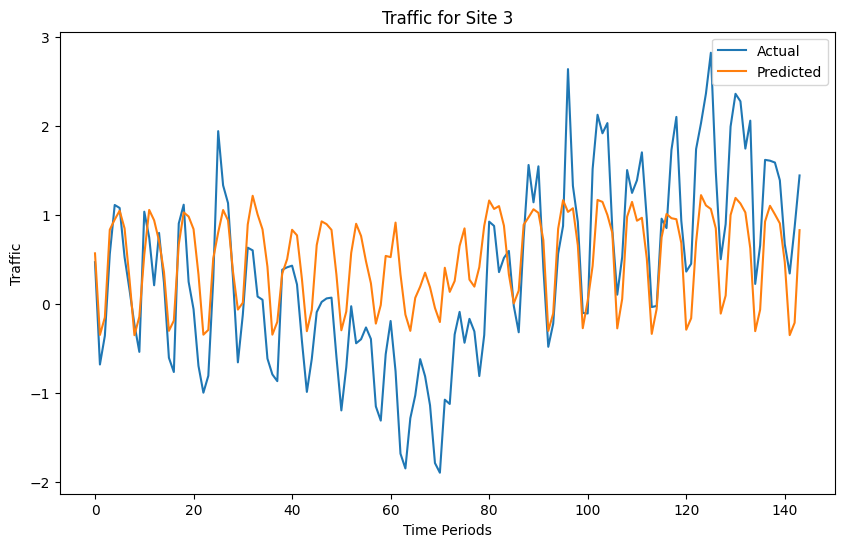

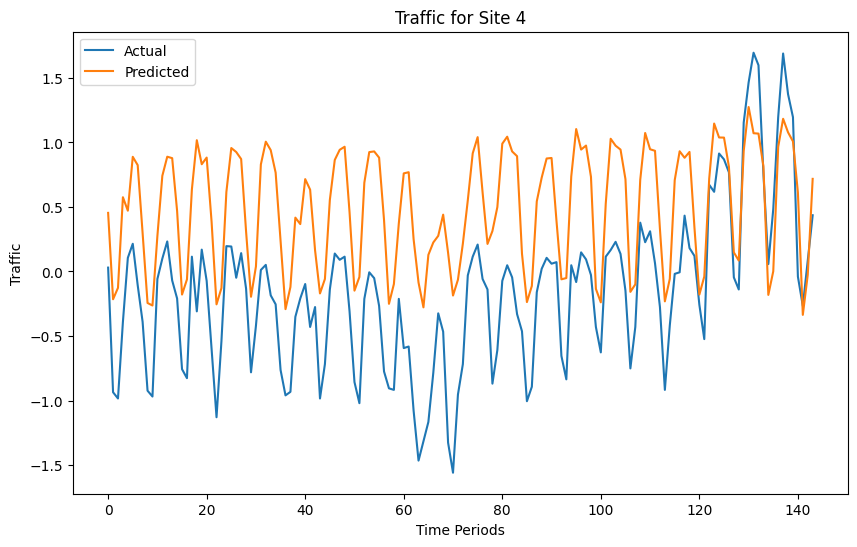

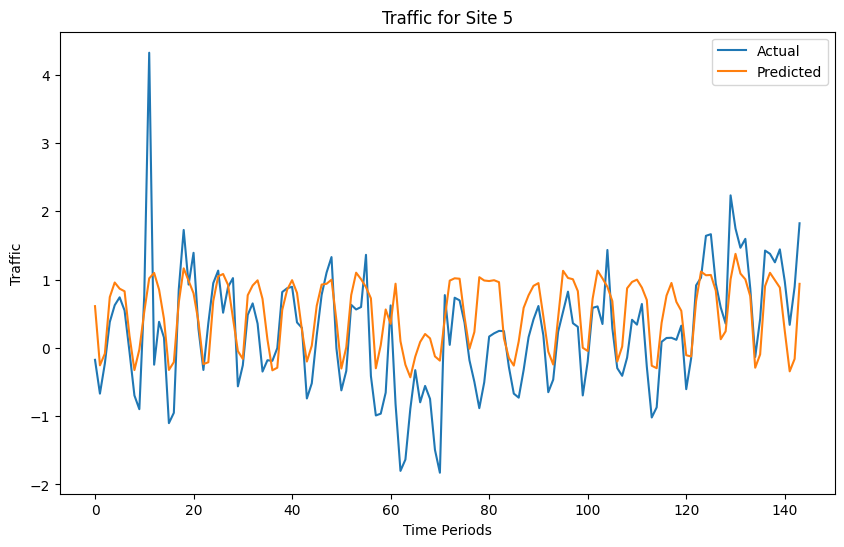

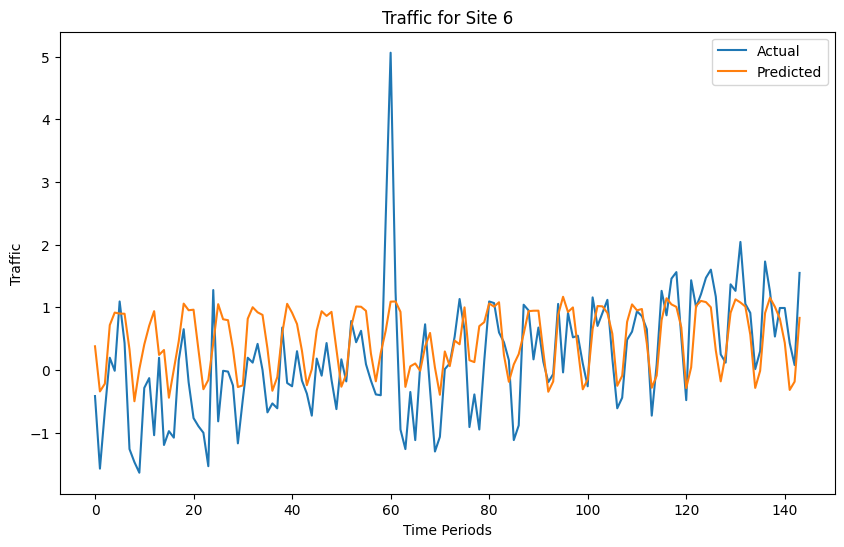

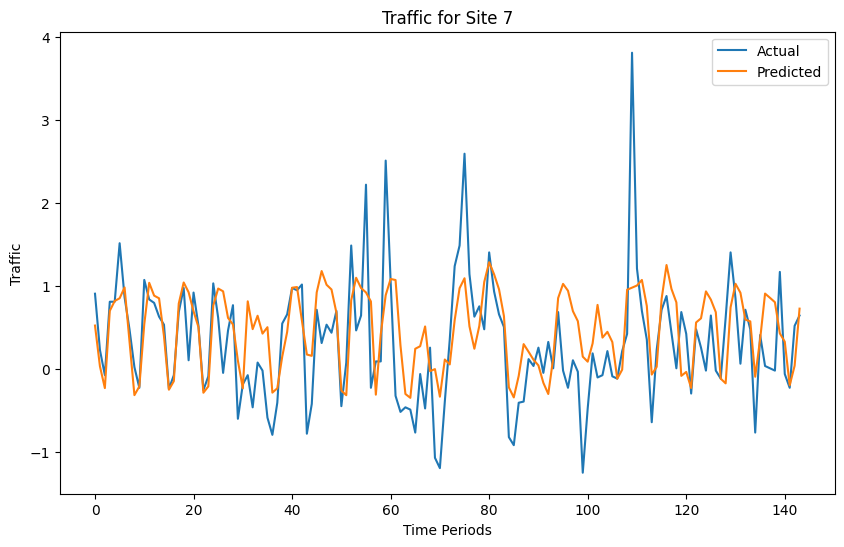

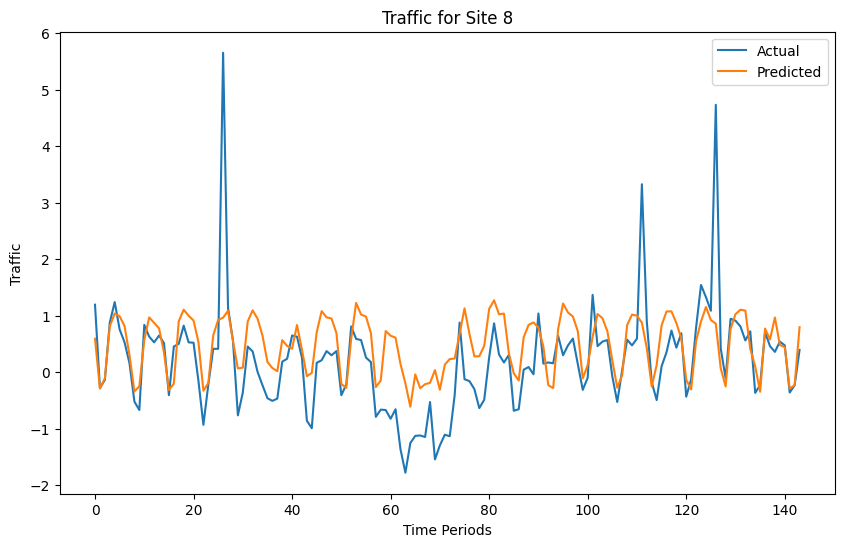

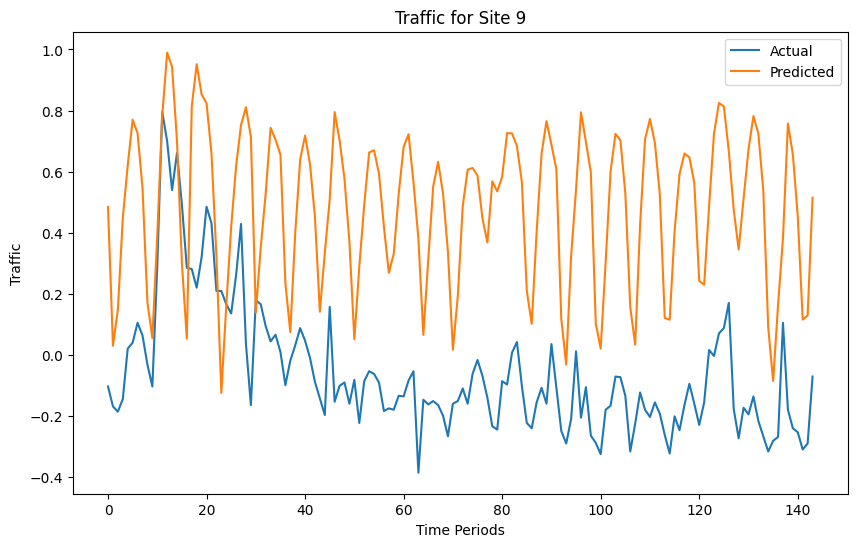

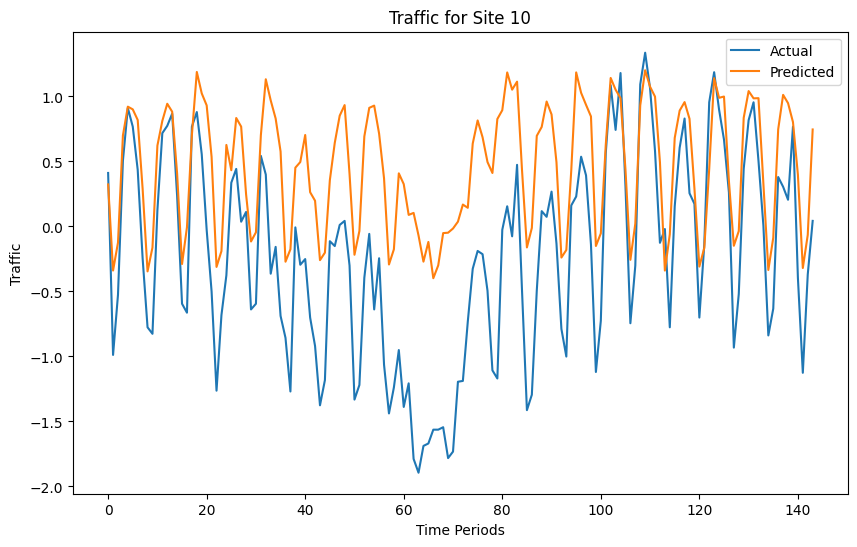

In [6]:
import matplotlib.pyplot as plt
import numpy as np

# Extract actual and predicted values for all sites
actual_values = [snapshot.y.numpy() for snapshot in test_dataset]
predicted_values = [model(snapshot.x, snapshot.edge_index, snapshot.edge_attr).detach().numpy() for snapshot in test_dataset]

# Convert lists to numpy arrays
actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

# Define the number of sites
num_sites = actual_values.shape[1]

# Plot actual vs predicted for each site
for site_index in range(10): #num_sites):
    # Create a new figure for each site
    plt.figure(figsize=(10, 6))

    # Plot actual and predicted values for the site
    plt.plot(actual_values[:, site_index], label='Actual')
    plt.plot(predicted_values[:, site_index], label='Predicted')

    plt.title(f'Traffic for Site {site_index+1}')
    plt.xlabel('Time Periods')
    plt.ylabel('Traffic')
    plt.legend()

    plt.show()

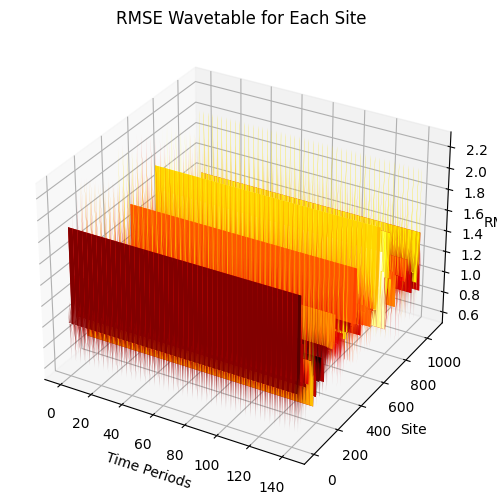

In [7]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Extract actual and predicted values for all sites
actual_values = [snapshot.y.numpy() for snapshot in test_dataset]
predicted_values = [model(snapshot.x, snapshot.edge_index, snapshot.edge_attr).detach().numpy() for snapshot in test_dataset]

# Convert lists to numpy arrays
actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values)

# Define the number of sites
num_sites = actual_values.shape[1]

# Calculate RMSE for each site
rmse_values = []
for site_index in range(num_sites):
    actual = actual_values[:, site_index]
    predicted = predicted_values[:, site_index]
    rmse = np.sqrt(np.mean((actual - predicted) ** 2))
    rmse_values.append(rmse)

# Create a 3D wavetable of RMSE values for each site over time
time_periods = range(actual_values.shape[0])
site_indices = range(num_sites)
rmse_wavetable = np.zeros((len(time_periods), len(site_indices)))
for i, t in enumerate(time_periods):
    for j, s in enumerate(site_indices):
        rmse_wavetable[i, j] = rmse_values[s]

# Create meshgrid for time periods and site indices
T, S = np.meshgrid(time_periods, site_indices)

# Plot the 3D wavetable of RMSE values
fig = plt.figure(figsize=(10, 6))
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(T, S, rmse_wavetable.T, cmap='hot')

ax.set_title('RMSE Wavetable for Each Site')
ax.set_xlabel('Time Periods')
ax.set_ylabel('Site')
ax.set_zlabel('RMSE')

plt.show()


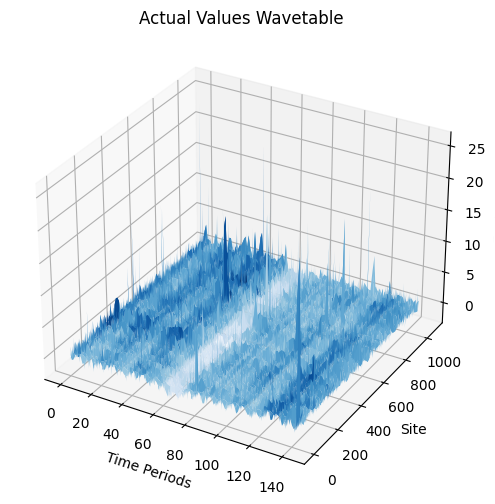

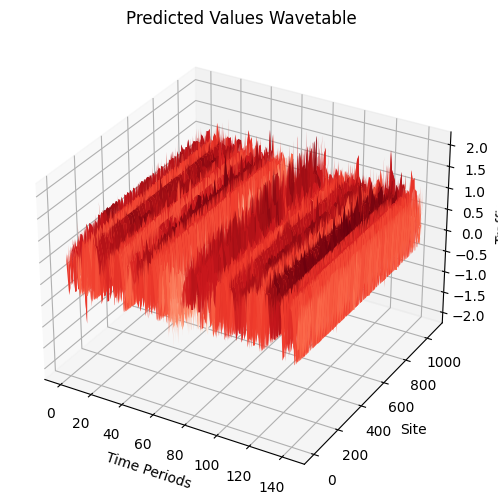

In [8]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

# Extract actual and predicted values for all sites
actual_values = [snapshot.y.numpy() for snapshot in test_dataset]
predicted_values = [model(snapshot.x, snapshot.edge_index, snapshot.edge_attr).detach().numpy() for snapshot in test_dataset]

# Convert lists to numpy arrays
actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values).squeeze()  # Remove extra dimension

# Define the number of sites and time periods
num_sites = actual_values.shape[1]
time_periods = range(actual_values.shape[0])

# Calculate RMSE for each site
rmse_actual = np.sqrt(np.mean((actual_values - predicted_values) ** 2, axis=0))
rmse_predicted = np.sqrt(np.mean((predicted_values - actual_values) ** 2, axis=0))

# Create meshgrid for time periods and site indices
T, S = np.meshgrid(time_periods, np.arange(num_sites))

# Plot the 3D wavetable for actual values
fig_actual = plt.figure(figsize=(10, 6))
ax_actual = fig_actual.add_subplot(111, projection='3d')
ax_actual.plot_surface(T, S, actual_values.T, cmap='Blues')

ax_actual.set_title('Actual Values Wavetable')
ax_actual.set_xlabel('Time Periods')
ax_actual.set_ylabel('Site')
ax_actual.set_zlabel('Traffic')

# Plot the 3D wavetable for predicted values
fig_predicted = plt.figure(figsize=(10, 6))
ax_predicted = fig_predicted.add_subplot(111, projection='3d')
ax_predicted.plot_surface(T, S, predicted_values.T, cmap='Reds')

ax_predicted.set_title('Predicted Values Wavetable')
ax_predicted.set_xlabel('Time Periods')
ax_predicted.set_ylabel('Site')
ax_predicted.set_zlabel('Traffic')

plt.show()


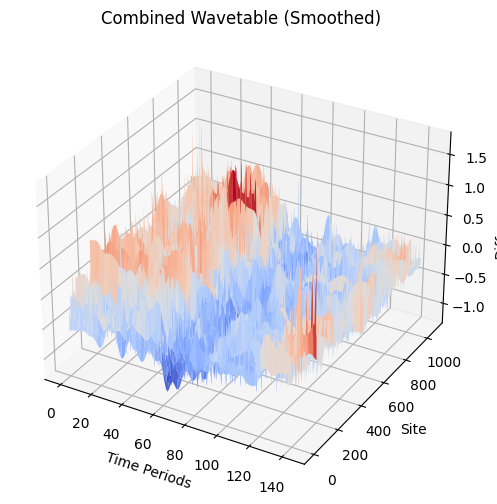

In [9]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from scipy.ndimage import gaussian_filter

# Extract actual and predicted values for all sites
actual_values = [snapshot.y.numpy() for snapshot in test_dataset]
predicted_values = [model(snapshot.x, snapshot.edge_index, snapshot.edge_attr).detach().numpy() for snapshot in test_dataset]

# Convert lists to numpy arrays
actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values).squeeze()  # Remove extra dimension

# Define the number of sites and time periods
num_sites = actual_values.shape[1]
time_periods = range(actual_values.shape[0])

# Calculate RMSE for each site
rmse_actual = np.sqrt(np.mean((actual_values - predicted_values) ** 2, axis=0))
rmse_predicted = np.sqrt(np.mean((predicted_values - actual_values) ** 2, axis=0))

# Create meshgrid for time periods and site indices
T, S = np.meshgrid(time_periods, np.arange(num_sites))

# Smooth the wavetables using Gaussian filtering
smooth_actual = gaussian_filter(actual_values.T, sigma=2)
smooth_predicted = gaussian_filter(predicted_values.T, sigma=2)

# Create a combined wavetable
combined_wavetable = smooth_actual - smooth_predicted

# Plot the combined wavetable
fig_combined = plt.figure(figsize=(10, 6))
ax_combined = fig_combined.add_subplot(111, projection='3d')
ax_combined.plot_surface(T, S, combined_wavetable, cmap='coolwarm')

ax_combined.set_title('Combined Wavetable (Smoothed)')
ax_combined.set_xlabel('Time Periods')
ax_combined.set_ylabel('Site')
ax_combined.set_zlabel('Difference')

plt.show()


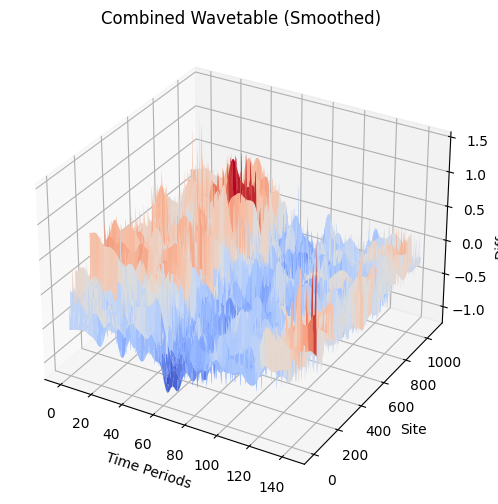

In [10]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np
from scipy.ndimage import gaussian_filter

# Extract actual and predicted values for all sites
actual_values = [snapshot.y.numpy() for snapshot in test_dataset]
predicted_values = [model(snapshot.x, snapshot.edge_index, snapshot.edge_attr).detach().numpy() for snapshot in test_dataset]

# Convert lists to numpy arrays
actual_values = np.array(actual_values)
predicted_values = np.array(predicted_values).squeeze()  # Remove extra dimension

# Define the number of sites and time periods
num_sites = actual_values.shape[1]
time_periods = range(actual_values.shape[0])

# Calculate RMSE for each site
rmse_actual = np.sqrt(np.mean((actual_values - predicted_values) ** 2, axis=0))
rmse_predicted = np.sqrt(np.mean((predicted_values - actual_values) ** 2, axis=0))

# Create meshgrid for time periods and site indices
T, S = np.meshgrid(time_periods, np.arange(num_sites))

# Smooth the wavetables using Gaussian filtering
smooth_actual = gaussian_filter(actual_values.T, sigma=2)
smooth_predicted = gaussian_filter(predicted_values.T, sigma=2)

# Create a combined wavetable
combined_wavetable = smooth_actual - smooth_predicted

# Apply additional smoothing to the combined wavetable
smooth_combined = gaussian_filter(combined_wavetable, sigma=1)

# Adjust the viewing angle of the 3D plot
# viewing_angle = (-45, 120)  # Azimuth, Elevation

# Plot the combined wavetable with adjusted viewing angle
fig_combined = plt.figure(figsize=(10, 6))
ax_combined = fig_combined.add_subplot(111, projection='3d')
ax_combined.plot_surface(T, S, smooth_combined, cmap='coolwarm')

ax_combined.set_title('Combined Wavetable (Smoothed)')
ax_combined.set_xlabel('Time Periods')
ax_combined.set_ylabel('Site')
ax_combined.set_zlabel('Difference')

# ax_combined.view_init(*viewing_angle)

plt.show()


In [11]:
import plotly.graph_objects as go
import numpy as np

# Generate example data
num_sites = 10
time_periods = 100
actual_values = np.random.rand(num_sites, time_periods)
predicted_values = np.random.rand(num_sites, time_periods)

# Create a meshgrid for x, y, and t coordinates
t, x = np.meshgrid(range(time_periods), range(num_sites))

# Create the figure
fig = go.Figure()

# Add the actual wavetable surface
fig.add_trace(go.Surface(x=x, y=t, z=actual_values, name='Actual', colorscale='YlOrRd', opacity=0.8))

# Add the predicted wavetable surface
fig.add_trace(go.Surface(x=x, y=t, z=predicted_values, name='Predicted', colorscale='Blues', opacity=0.8))

# Set the layout
fig.update_layout(
    title='Actual vs Predicted Wavetable',
    scene=dict(
        xaxis_title='Site',
        yaxis_title='Time Periods',
        zaxis_title='Traffic',
        aspectratio=dict(x=1, y=1, z=0.8),
        aspectmode='auto',
        xaxis=dict(backgroundcolor='rgb(17, 17, 17)', gridcolor='rgba(255, 255, 255, 0.1)'),
        yaxis=dict(backgroundcolor='rgb(17, 17, 17)', gridcolor='rgba(255, 255, 255, 0.1)'),
        zaxis=dict(backgroundcolor='rgb(17, 17, 17)', gridcolor='rgba(255, 255, 255, 0.1)')
    ),
    paper_bgcolor='rgb(17, 17, 17)',
    plot_bgcolor='rgb(17, 17, 17)'
)

# Define the animation frames
frames = [
    go.Frame(
        data=[
            go.Surface(z=actual_values[:, :i]),
            go.Surface(z=predicted_values[:, :i])
        ],
        name=f'frame{i}'
    )
    for i in range(1, time_periods)
]

# Add the frames to the figure
fig.frames = frames

# Show the figure
fig.show()


In [12]:
import plotly.graph_objects as go
import numpy as np

# Generate example data
num_sites = 10
time_periods = 100
actual_values = np.random.rand(num_sites, time_periods)
predicted_values = np.random.rand(num_sites, time_periods)

# Create a meshgrid for x, y, and t coordinates
t, x = np.meshgrid(range(time_periods), range(num_sites))

# Create the figure
fig = go.Figure()

# Add the actual wavetable surface
fig.add_trace(go.Surface(x=x, y=t, z=actual_values, name='Actual'))

# Add the predicted wavetable surface
fig.add_trace(go.Surface(x=x, y=t, z=predicted_values, name='Predicted'))

# Set the layout with dark theme
fig.update_layout(
    title='Actual vs Predicted Wavetable',
    scene=dict(
        xaxis_title='Site',
        yaxis_title='Time Periods',
        zaxis_title='Traffic',
        xaxis=dict(backgroundcolor='rgb(17, 17, 17)', gridcolor='white'),
        yaxis=dict(backgroundcolor='rgb(17, 17, 17)', gridcolor='white'),
        zaxis=dict(backgroundcolor='rgb(17, 17, 17)', gridcolor='white'),
        bgcolor='rgb(17, 17, 17)'
    ),
    paper_bgcolor='rgb(17, 17, 17)',
    font=dict(color='white'),
    updatemenus=[dict(type='buttons',
                      showactive=False,
                      buttons=[dict(label='Play',
                                    method='animate',
                                    args=[None, {'frame': {'duration': 200, 'redraw': True}, 'fromcurrent': True}]),
                               dict(label='Pause',
                                    method='animate',
                                    args=[[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate'}])]
                     )
                ]
)

# Define the animation frames
frames = [
    go.Frame(
        data=[
            go.Surface(z=actual_values[:, :i]),
            go.Surface(z=predicted_values[:, :i])
        ],
        name=f'frame{i}'
    )
    for i in range(1, time_periods)
]

# Add the frames to the figure
fig.frames = frames

# Show the figure
fig.show()


In [13]:
import plotly.graph_objects as go
import numpy as np

# Generate example data
num_sites = 10
time_periods = 100
rmse_values = np.random.rand(num_sites, time_periods)

# Create a meshgrid for x, y, and t coordinates
t, x = np.meshgrid(range(time_periods), range(num_sites))

# Create the figure
fig = go.Figure()

# Add the RMSE surface
fig.add_trace(go.Surface(x=x, y=t, z=rmse_values))

# Set the layout with dark theme
fig.update_layout(
    title='RMSE per Site over Time',
    scene=dict(
        xaxis_title='Site',
        yaxis_title='Time Periods',
        zaxis_title='RMSE',
        xaxis=dict(backgroundcolor='rgb(17, 17, 17)', gridcolor='white'),
        yaxis=dict(backgroundcolor='rgb(17, 17, 17)', gridcolor='white'),
        zaxis=dict(backgroundcolor='rgb(17, 17, 17)', gridcolor='white'),
        bgcolor='rgb(17, 17, 17)'
    ),
    paper_bgcolor='rgb(17, 17, 17)',
    font=dict(color='white'),
    updatemenus=[
        dict(
            type='buttons',
            showactive=False,
            buttons=[
                dict(
                    label='Play',
                    method='animate',
                    args=[None, {'frame': {'duration': 500, 'redraw': True}, 'fromcurrent': True, 'transition': {'duration': 0}}]
                ),
                dict(
                    label='Pause',
                    method='animate',
                    args=[[None], {'frame': {'duration': 0, 'redraw': False}, 'mode': 'immediate', 'transition': {'duration': 0}}]
                )
            ],
            direction='left',
            pad={'r': 10, 't': 10},
            x=0.1,
            xanchor='right',
            y=0,
            yanchor='top',
            bgcolor='rgb(17, 17, 17)',
            font=dict(color='white')
        )
    ]
)

# Define the animation frames
frames = [
    go.Frame(
        data=[go.Surface(z=rmse_values[:, :i])]
    )
    for i in range(1, time_periods)
]

# Add the frames to the figure
fig.frames = frames

# Show the figure
fig.show()
